**Install pandas to read the data from our CSV file**

In [1]:
pip install pandas

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


**Install dash for interactive plots**

In [1]:
pip install dash

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


**Load up the dataset and read from the file using pandas**

In [1]:
import pandas as pd

crime_file = "dataset/crime.csv"

'''
latin1 can handle more characters than the default
UTF-8 fails 
'''
df = pd.read_csv(crime_file, encoding='latin1')
print("Columns in the DataFrame:", df.columns)


df.head()
# Print the data frame
# print(df)

C:\Users\succe\AppData\Local\Temp\ipykernel_13480\2225603515.py:9: DtypeWarning: Columns (6) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(crime_file, encoding='latin1')


Columns in the DataFrame: Index(['INCIDENT_NUMBER', 'OFFENSE_CODE', 'OFFENSE_CODE_GROUP',
       'OFFENSE_DESCRIPTION', 'DISTRICT', 'REPORTING_AREA', 'SHOOTING',
       'OCCURRED_ON_DATE', 'YEAR', 'MONTH', 'DAY_OF_WEEK', 'HOUR', 'UCR_PART',
       'STREET', 'Lat', 'Long', 'Location'],
      dtype='object')


,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182080058,2403,Disorderly Conduct,DISTURBING THE PEACE,E18,495,NaN,2018-10-03 20:13:00,2018,10,Wednesday,20,Part Two,ARLINGTON ST,42.262608,-71.121186,"(42.26260773, -71.12118637)"
1,I182080053,3201,Property Lost,PROPERTY - LOST,D14,795,NaN,2018-08-30 20:00:00,2018,8,Thursday,20,Part Three,ALLSTON ST,42.352111,-71.135311,"(42.35211146, -71.13531147)"
2,I182080052,2647,Other,THREATS TO DO BODILY HARM,B2,329,NaN,2018-10-03 19:20:00,2018,10,Wednesday,19,Part Two,DEVON ST,42.308126,-71.076930,"(42.30812619, -71.07692974)"
3,I182080051,413,Aggravated Assault,ASSAULT - AGGRAVATED - BATTERY,A1,92,NaN,2018-10-03 20:00:00,2018,10,Wednesday,20,Part One,CAMBRIDGE ST,42.359454,-71.059648,"(42.35945371, -71.05964817)"
4,I182080050,3122,Aircraft,AIRCRAFT INCIDENTS,A7,36,NaN,2018-10-03 20:49:00,2018,10,Wednesday,20,Part Three,PRESCOTT ST,42.375258,-71.024663,"(42.37525782, -71.02466343)"


**Clean the dataset**

In [3]:
# Print the column names (keys) of the DataFrame
print("Columns in the DataFrame:", df.columns)

# The SHOOTING column is empty so remove it from the dataframe
df = df.drop(columns=['SHOOTING'])

Columns in the DataFrame: Index(['INCIDENT_NUMBER', 'OFFENSE_CODE', 'OFFENSE_CODE_GROUP',
       'OFFENSE_DESCRIPTION', 'DISTRICT', 'REPORTING_AREA', 'SHOOTING',
       'OCCURRED_ON_DATE', 'YEAR', 'MONTH', 'DAY_OF_WEEK', 'HOUR', 'UCR_PART',
       'STREET', 'Lat', 'Long', 'Location'],
      dtype='object')


In [28]:

# Fill empty cells in REPORTING_AREA with 0
df['REPORTING_AREA'] = df['REPORTING_AREA'].fillna('0')

# Search for empty cells in the entire dataframe
empty_cells = df.isnull()

# Print the columns that have empty cells
columns_with_empty_cells = empty_cells.any()
print("Columns with empty cells:", columns_with_empty_cells[columns_with_empty_cells].index.tolist())

# Print the number of empty cells in the entire dataframe
num_empty_cells = empty_cells.sum().sum()
print("Number of empty cells:", num_empty_cells)


# Print the data frame
# print(df)

df.head()

Columns with empty cells: ['DISTRICT', 'UCR_PART', 'STREET', 'Lat', 'Long']
Number of empty cells: 54108


,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182080058,2403,Disorderly Conduct,DISTURBING THE PEACE,E18,495,2018-10-03 20:13:00,2018,10,Wednesday,20,Part Two,ARLINGTON ST,42.262608,-71.121186,"(42.26260773, -71.12118637)"
1,I182080053,3201,Property Lost,PROPERTY - LOST,D14,795,2018-08-30 20:00:00,2018,8,Thursday,20,Part Three,ALLSTON ST,42.352111,-71.135311,"(42.35211146, -71.13531147)"
2,I182080052,2647,Other,THREATS TO DO BODILY HARM,B2,329,2018-10-03 19:20:00,2018,10,Wednesday,19,Part Two,DEVON ST,42.308126,-71.076930,"(42.30812619, -71.07692974)"
3,I182080051,413,Aggravated Assault,ASSAULT - AGGRAVATED - BATTERY,A1,92,2018-10-03 20:00:00,2018,10,Wednesday,20,Part One,CAMBRIDGE ST,42.359454,-71.059648,"(42.35945371, -71.05964817)"
4,I182080050,3122,Aircraft,AIRCRAFT INCIDENTS,A7,36,2018-10-03 20:49:00,2018,10,Wednesday,20,Part Three,PRESCOTT ST,42.375258,-71.024663,"(42.37525782, -71.02466343)"


**Replace empty cells with appropriate data**

In [5]:
# Fill empty cells in specific columns with appropriate values
df['DISTRICT'] = df['DISTRICT'].fillna('Unknown')
df['UCR_PART'] = df['UCR_PART'].fillna('Unknown')
df['STREET'] = df['STREET'].fillna('Unknown')
df['Lat'] = df['Lat'].fillna(0.0)
df['Long'] = df['Long'].fillna(0.0)

# Search for empty cells in the entire dataframe
empty_cells = df.isnull()

# Print the columns that have empty cells
columns_with_empty_cells = empty_cells.any()
print("Columns with empty cells:", columns_with_empty_cells[columns_with_empty_cells].index.tolist())

# Print the number of empty cells in the entire dataframe
num_empty_cells = empty_cells.sum().sum()
print("Number of empty cells:", num_empty_cells)


Columns with empty cells: []
Number of empty cells: 0


**Data Analysis - UCR (Uniform Crime Reporting) has only 2 parts, What does part 3 UCR mean?
(source: https://ucr.fbi.gov/crime-in-the-u.s/2019/crime-in-the-u.s.-2019/topic-pages/offense-definitions)**

**Categorize and visualize OFFENSE_CODE_GROUP by UCR_PART to find out what part 3 UCR means?**

In [7]:
# Install plotly
!pip install plotly

Defaulting to user installation because normal site-packages is not writeable


In [9]:
import plotly.express as px

# Categorize OFFENSE_CODE_GROUP by UCR_PART
offense_group_by_ucr = df.groupby(['UCR_PART', 'OFFENSE_CODE_GROUP']).size().reset_index(name='Count')

# Print the categorized data
offense_group_by_ucr


,UCR_PART,OFFENSE_CODE_GROUP,Count
0,Other,Arson,95
1,Other,Auto Theft Recovery,1082
2,Other,Burglary - No Property Taken,2
3,Other,License Plate Related Incidents,71
4,Other,Manslaughter,9
...,...,...,...
69,Part Two,Violations,6226
70,Unknown,HOME INVASION,80
71,Unknown,HUMAN TRAFFICKING,7
72,Unknown,HUMAN TRAFFICKING - INVOLUNTARY SERVITUDE,2


**List offenses under part 3**

In [11]:
# Filter the DataFrame to get only Part 3 offenses
part_3_offenses = df[df['UCR_PART'] == 'Part Three']

# Get the unique categories under Part 3
part_3_categories = part_3_offenses['OFFENSE_CODE_GROUP'].unique()

# Print the categories
print("Categories under Part 3:")
for category in part_3_categories:
    print(category)

Categories under Part 3:
Property Lost
Aircraft
Motor Vehicle Accident Response
Verbal Disputes
Towed
Medical Assistance
Investigate Person
Fire Related Reports
Investigate Property
Warrant Arrests
Property Found
Missing Person Reported
Landlord/Tenant Disputes
Other
Missing Person Located
License Plate Related Incidents
Property Related Damage
Police Service Incidents
License Violation
Assembly or Gathering Violations
Search Warrants
Firearm Discovery
Harbor Related Incidents
Service
Explosives
Prisoner Related Incidents


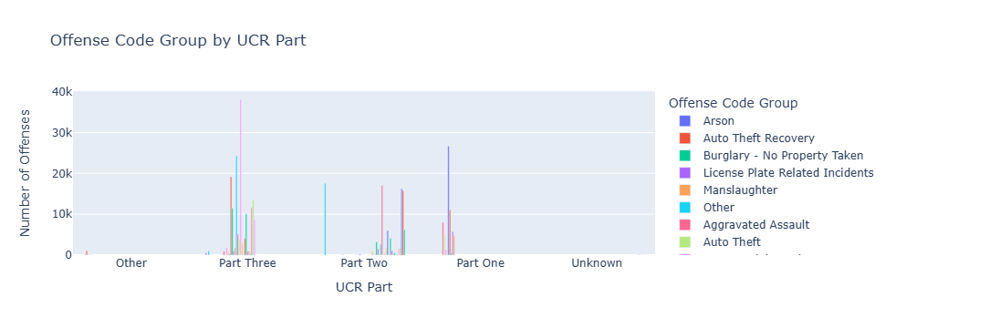

In [13]:
# Create a bar chart using Plotly
fig = px.bar(offense_group_by_ucr, x='UCR_PART', y='Count', color='OFFENSE_CODE_GROUP',
             title='Offense Code Group by UCR Part',
             labels={'UCR_PART': 'UCR Part', 'Count': 'Number of Offenses', 'OFFENSE_CODE_GROUP': 'Offense Code Group'},
             barmode='group')

# Show the plot
fig.show()

**Interactive Plot with dash**

In [15]:
import dash
from dash import dcc, html
from dash.dependencies import Input, Output
import plotly.express as px
import pandas as pd

# Get unique UCR_PART values for the dropdown options
ucr_parts = offense_group_by_ucr['UCR_PART'].unique()
print(offense_group_by_ucr)
print(ucr_parts)
dropdown_options = [{'label': 'All', 'value': 'All'}] + [{'label': part, 'value': part} for part in ucr_parts]

# Initialize the Dash app
app = dash.Dash(__name__)

# Layout of the app
app.layout = html.Div([
    dcc.Dropdown(
        id='ucr-part-dropdown',
        options=dropdown_options,
        value='All'
    ),
    dcc.Graph(id='bar-chart')
])

# Callback to update the bar chart based on dropdown selection
@app.callback(
    Output('bar-chart', 'figure'),
    [Input('ucr-part-dropdown', 'value')]
)
def update_bar_chart(selected_part):
    if selected_part == 'All':
        filtered_data = offense_group_by_ucr
    else:
        filtered_data = offense_group_by_ucr[offense_group_by_ucr['UCR_PART'] == selected_part]
    
    fig = px.bar(filtered_data, x='OFFENSE_CODE_GROUP', y='Count', color='OFFENSE_CODE_GROUP',
                 title='Offense Code Group by UCR Part',
                 labels={'UCR_PART': 'UCR Part', 'Count': 'Number of Offenses', 'OFFENSE_CODE_GROUP': 'Offense Code Group'},
                 barmode='group')
    return fig

# Run the app
if __name__ == '__main__':
    app.run_server(debug=True)


    UCR_PART                         OFFENSE_CODE_GROUP  Count
0      Other                                      Arson     95
1      Other                        Auto Theft Recovery   1082
2      Other               Burglary - No Property Taken      2
3      Other            License Plate Related Incidents     71
4      Other                               Manslaughter      9
..       ...                                        ...    ...
69  Part Two                                 Violations   6226
70   Unknown                              HOME INVASION     80
71   Unknown                          HUMAN TRAFFICKING      7
72   Unknown  HUMAN TRAFFICKING - INVOLUNTARY SERVITUDE      2
73   Unknown                         INVESTIGATE PERSON      4

[74 rows x 3 columns]
['Other' 'Part One' 'Part Three' 'Part Two' 'Unknown']


**Treemap to find the crime share for UCR part 1 offenses on each street**

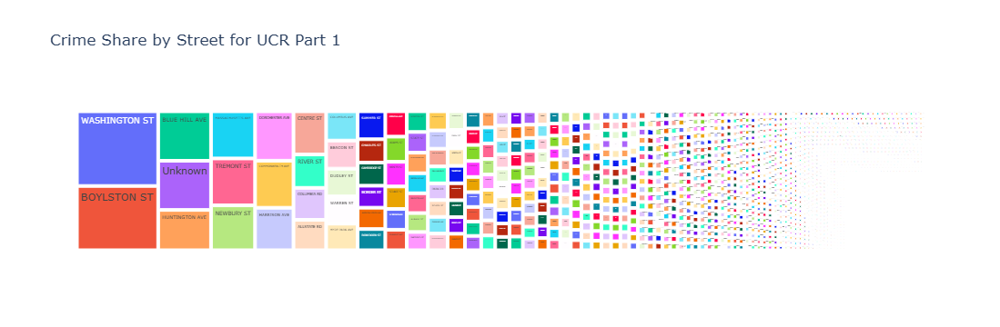

In [74]:
part_1_offences = df[df['UCR_PART'] == 'Part One']

crime_by_street_ucr_1 = part_1_offences.groupby('STREET').size().reset_index(name='Count')
# print(part_1_offences)

# Create a treemap using Plotly
fig = px.treemap(crime_by_street_ucr_1, path=['STREET'], values='Count',
                 title='Crime Share by Street for UCR Part 1',
                 labels={'STREET': 'Street', 'Count': 'Number of Offenses'})

# Show the plot
fig.show()

**Treemap to find the crime share for UCR part 2 offenses on each street**

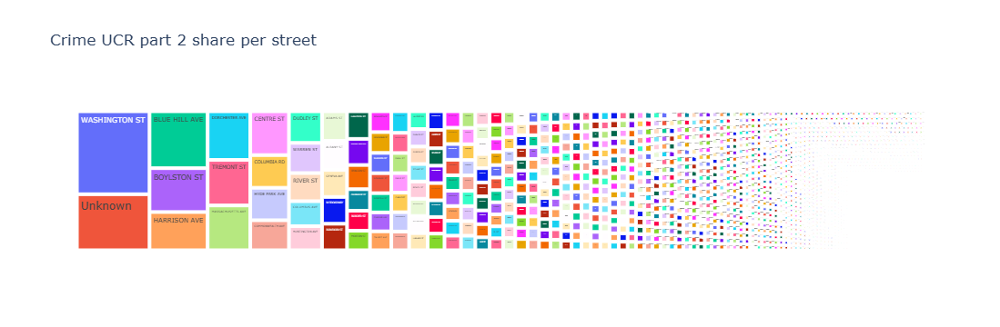

In [78]:
UCR_part_two = df[df['UCR_PART'] == 'Part Two']

crime_street_ucr_part_two = UCR_part_two.groupby('STREET').size().reset_index(name = 'count')

fig = px.treemap(crime_street_ucr_part_two, path = ['STREET'], values ='count',
                 title ='Crime UCR part 2 share per street',
                 labels = {'STREET': 'Street', 'count': 'Number of offences'})

fig.show()

**Treemap to find the crime share for UCR part 3 offenses on each street**

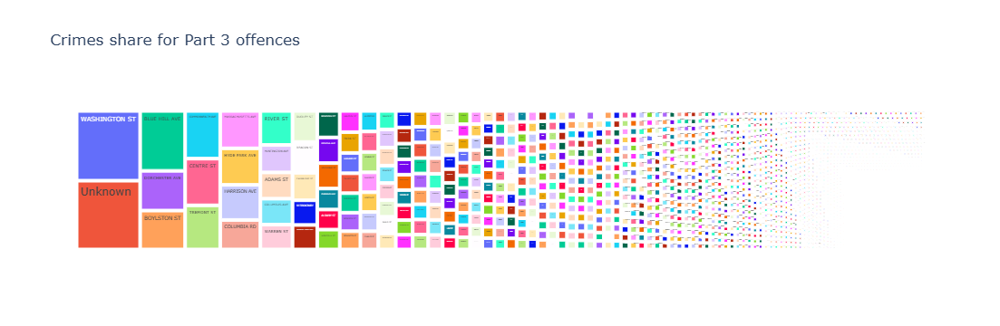

In [84]:
UCR_Part_2 = df[df['UCR_PART'] == 'Part Three']

crime_street_UCR_Part_2 = UCR_Part_2.groupby('STREET').size().reset_index(name = 'Count')

fig = px.treemap(crime_street_UCR_Part_2, path = ['STREET'], values ='Count',
                 title = 'Crimes share for Part 3 offences',
                 labels = {'STREET':'Street', 'Count': 'Number of offences'})

fig.show()

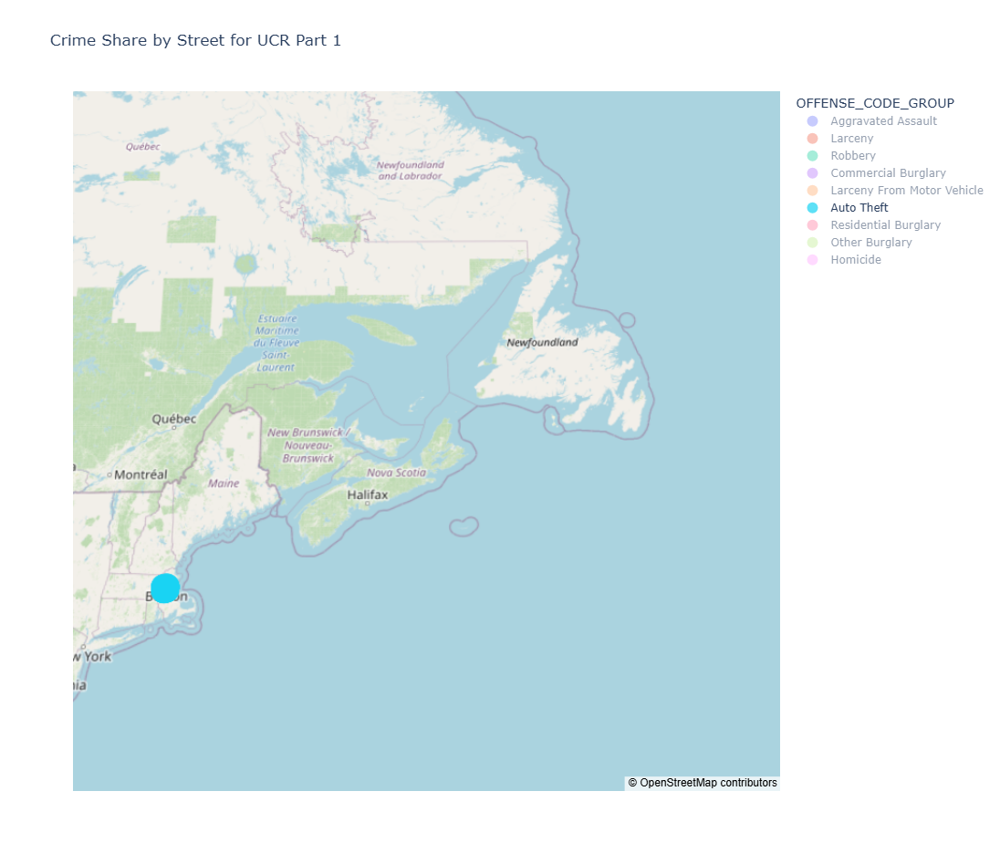

In [87]:
import random

# Group by STREET and count the number of offenses
crime_by_street_ucr_1 = part_1_offences.groupby('STREET').size().reset_index(name='Count')

# Rename the Count column to avoid conflicts
crime_by_street_ucr_1.rename(columns={'Count': 'OFFENSE_COUNT'}, inplace=True)

# Drop the Offense Count column from the original DataFrame if it exists
if 'OFFENSE_COUNT' in part_1_offences.columns:
    part_1_offences = part_1_offences.drop(columns=['OFFENSE_COUNT'])

# Merge the count data back with the original DataFrame to include Lat and Long
part_1_offences = part_1_offences.merge(crime_by_street_ucr_1, on='STREET')

# Select a random latitude and longitude from the dataset
random_index = random.randint(0, len(part_1_offences) - 1)
random_lat = part_1_offences.iloc[random_index]['Lat']
random_lon = part_1_offences.iloc[random_index]['Long']

# Create a scatter mapbox plot
fig_mapbox = px.scatter_mapbox(
    part_1_offences,
    lat="Lat",
    lon="Long",
    size="OFFENSE_COUNT",
    color="OFFENSE_CODE_GROUP",
    hover_name="STREET",
    zoom=5,  # Adjust the zoom level as needed
    center={"lat": random_lat, "lon": random_lon},  # Center the map around the data
    mapbox_style="open-street-map",
    title="Crime Share by Street for UCR Part 1"
)

fig_mapbox.update_layout(height=950)

# Show the plot
fig_mapbox.show()

Note: Datapoints in africa lol!! Ask if it would be wise to to get the street name of lat and long with 0 and insert the lat and long of other offense code group with the same streetname